<img src='task.png' width='500px'>

In [6]:
! python3 -m pip install torch
! python3 -m pip install torchvision
! python3 -m pip install scikit-image

You should consider upgrading via the '/Library/Frameworks/Python.framework/Versions/3.7/bin/python3 -m pip install --upgrade pip' command.
You should consider upgrading via the '/Library/Frameworks/Python.framework/Versions/3.7/bin/python3 -m pip install --upgrade pip' command.
     |████████████████████████████████| 12.1 MB 278 kB/s eta 0:00:01
     |████████████████████████████████| 1.6 MB 355 kB/s eta 0:00:01
     |████████████████████████████████| 148 kB 43 kB/s eta 0:00:01     |████████████████████████████▊   | 133 kB 43 kB/s eta 0:00:01
     |████████████████████████████████| 3.3 MB 342 kB/s eta 0:00:01
     |████████████████████████████████| 4.3 MB 269 kB/s eta 0:00:01
You should consider upgrading via the '/Library/Frameworks/Python.framework/Versions/3.7/bin/python3 -m pip install --upgrade pip' command.


In [16]:
import os
import numpy as np
import shutil
from PIL import Image
from matplotlib.pyplot import imshow
from IPython.display import display
%matplotlib inline

<h1>Data Processing</h1>

In [17]:
categories = ('male', 'female')
root_dir = 'data'

рассортировываем данные по train и test:

In [18]:
test_ratio = 0.1

for category in categories:
    shutil.rmtree(root_dir +'/train/' + category)
    os.makedirs(root_dir +'/train/' + category)
    shutil.rmtree(root_dir +'/test/' + category)
    os.makedirs(root_dir +'/test/' + category)
    
    copy_from_dir = 'photos/' + category
    
    all_filenames = os.listdir(copy_from_dir)
    np.random.shuffle(all_filenames)
    train_filenames, test_filenames = np.split(
        np.array(all_filenames),
        [int(len(all_filenames) * (1 - test_ratio))]
    )
    train_filenames = [copy_from_dir + '/' + name for name in train_filenames.tolist()]
    test_filenames = [copy_from_dir + '/' + name for name in test_filenames.tolist()]
    
    print(f'Category {category}.')
    print('Number of total images: ', len(all_filenames))
    print('Training: ', len(train_filenames))
    print('Testing: ', len(test_filenames))
    
    for name in train_filenames:
        shutil.copy(name, root_dir + '/train/' + category)

    for name in test_filenames:
        shutil.copy(name, root_dir +'/test/' + category)

Category male.
Number of total images:  50001
Training:  45000
Testing:  5001
Category female.
Number of total images:  50001
Training:  45000
Testing:  5001


to learn images ratio:

In [5]:
max_ratio = 0
min_width = 1000000000
max_width = 0
min_height = 100000000
max_height = 0

for category in categories:
    source_dir = 'photos/' + category
    
    for photo in os.listdir(source_dir):
        im = Image.open(source_dir + '/' + photo)
        width, height = im.size
        if min_width > width:
            min_width = width
        if max_width < width:
            max_width = width
        if min_height > height:
            min_height = height
        if max_height < height:
            max_height = height
        if max(width, height) / min(width, height) > max_ratio:
            max_ratio = max(width, height) / min(width, height)

print(f'min width: {min_width}')
print(f'max width: {max_width}')
print(f'min height: {min_height}')
print(f'max height: {max_height}')
print(f'max ratio: {max_ratio}')

min width: 16
max width: 2266
min height: 23
max height: 3200
max ratio: 2.4776119402985075


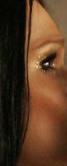

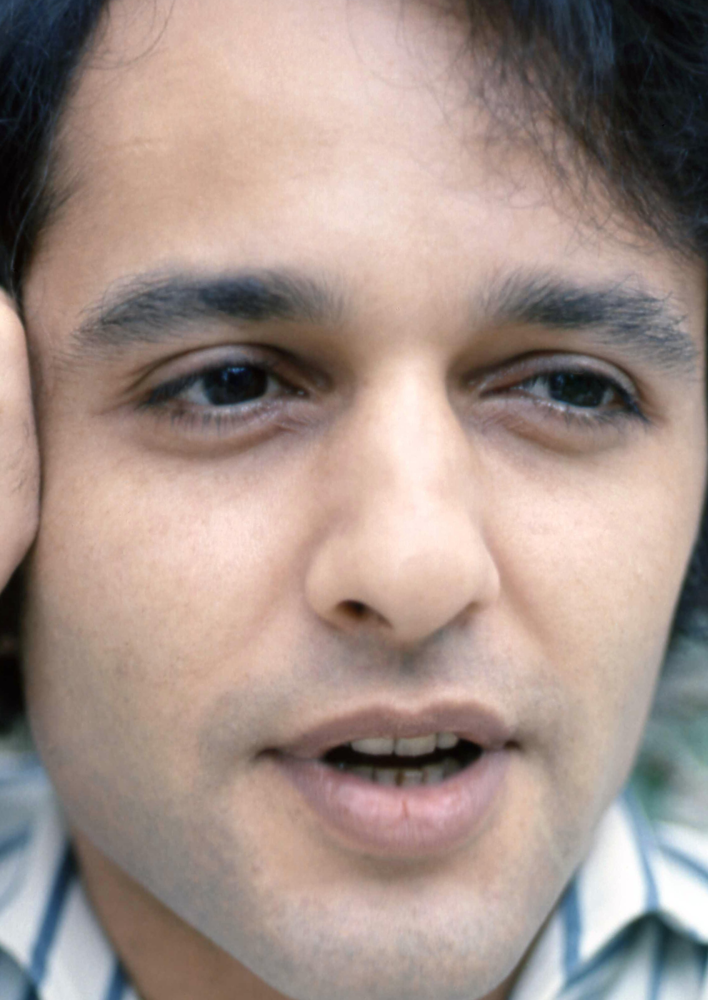

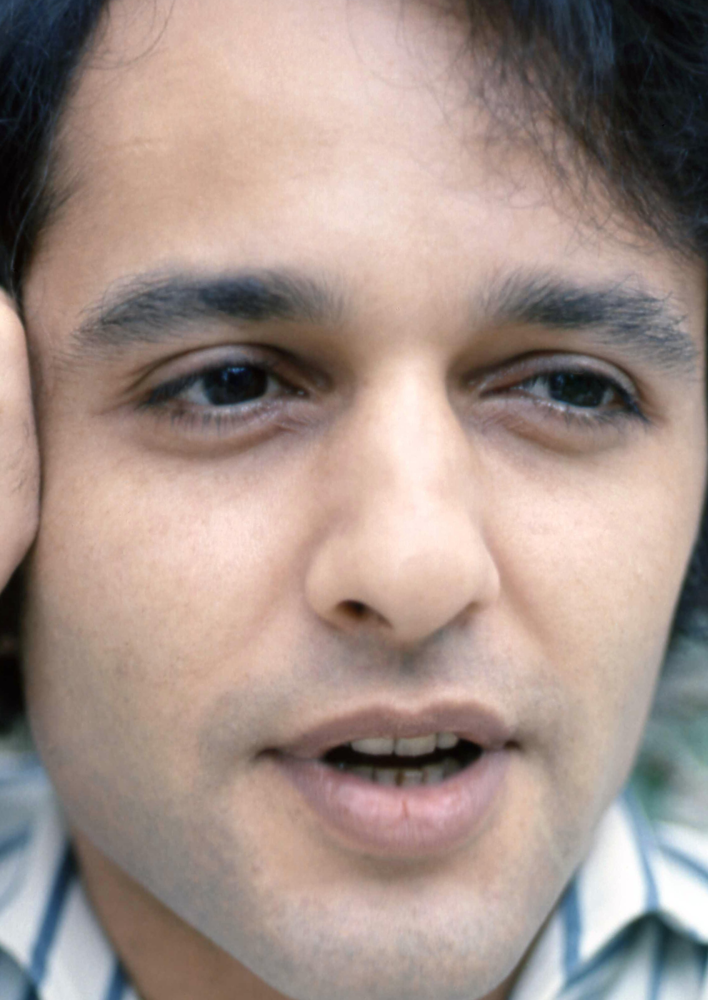

number of small images: 70


In [37]:
cnt_small = 0

for category in categories:
    source_dir = 'photos/' + category
    
    for photo in os.listdir(source_dir):
        im = Image.open(source_dir + '/' + photo)
        width, height = im.size
        cnt_small += (width < 32 or height < 32)
        if height == max_height:
            display(im)
        if width == max_width:
            display(im)
        if abs(max(width, height) / min(width, height) - max_ratio) < 0.001:
            display(im)

print(f'number of small images: {cnt_small}')

смотрим, есть ли в датасете файлы, кроме jpg:

In [23]:
special_format_files = []
for category in categories:
    source_dir = os.path.join('photos', category)
    special_format_files += [file for file in os.listdir(source_dir) if not file.endswith('.jpg')]
print(special_format_files)

[]


значит, в папке только jpg файлы.

<h1>Model Training</h1>

In [6]:
import torch
import torchvision
import torchvision.transforms as transforms
import torch.nn as nn
import torch.optim as optim

In [7]:
im_size = 32

In [61]:
transform = transforms.Compose([
    #transforms.ToPILImage(),
    # images have different sizes, so we need to resize them
    transforms.Resize((im_size, im_size), interpolation=2),
    transforms.ToTensor(),
    # transform PIL image range [0, 1] to [-1, 1] (this helps in faster convergence)
    transforms.Normalize((.5, .5, .5), (.5, .5, .5))])                                 

In [62]:
train_str = 'train'
test_str = 'test'

def load_dataset(name):
    data_path = f'data/{name}/'
    dataset = torchvision.datasets.ImageFolder(
        root=data_path,
        transform=transform
    )
    print(dataset.transform)
    loader = torch.utils.data.DataLoader(
        dataset,
        batch_size=64,
        num_workers=2,
        shuffle=True
    )
    return loader

In [63]:
trainloader = load_dataset(train_str)
testloader = load_dataset(test_str)

Compose(
    Resize(size=(32, 32), interpolation=PIL.Image.BILINEAR)
    ToTensor()
    Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))
)
Compose(
    Resize(size=(32, 32), interpolation=PIL.Image.BILINEAR)
    ToTensor()
    Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))
)


In [31]:
class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        self.conv1 = nn.Conv2d(3, 6, 5)
        self.pool = nn.MaxPool2d(2, 2)  # to calculate max of input patch values
        self.conv2 = nn.Conv2d(6, 16, 5)
        self.fc1 = nn.Linear(16 * 5 * 5, 120)  # fully connected layer
        self.fc2 = nn.Linear(120, 84)
        self.fc3 = nn.Linear(84, len(categories))

    def forward(self, x):
        x = self.pool(nn.functional.relu(self.conv1(x)))
        x = self.pool(nn.functional.relu(self.conv2(x)))
        x = x.view(-1, 16 * 5 * 5)  # make matrix (from tensor) having 16*5*5 columns (= numpy reshape)
        x = nn.functional.relu(self.fc1(x))
        x = nn.functional.relu(self.fc2(x))
        x = self.fc3(x)
        return x


net = Net()

In [32]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(net.parameters(), lr=0.001, momentum=0.9)

In [65]:
for epoch in range(9):  # loop over the dataset multiple times

    running_loss = 0.0
    for i, (inputs, labels) in enumerate(trainloader):
        # zero the parameter gradients
        optimizer.zero_grad()

        # forward + backward + optimize
        outputs = net(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        # print statistics
        running_loss += loss.item()
        if i % 2000 == 1999:    # print every 2000 mini-batches
            print('[%d, %5d] loss: %.3f' %
                  (epoch + 1, i + 1, running_loss / 2000))
            running_loss = 0.0

print('Finished Training')

Finished Training


In [ ]:
PATH = './model.pth'
torch.save(net.state_dict(), PATH)

In [ ]:
correct = 0
total = 0
with torch.no_grad():
    for data in testloader:
        images, labels = data
        outputs = net(images)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

print('Accuracy of the network on the 500 test images: %d %%' % (
    100 * correct / total))

In [66]:
help(torch.utils.data.DataLoader)

Help on class DataLoader in module torch.utils.data.dataloader:

class DataLoader(builtins.object)
 |  DataLoader(dataset, batch_size=1, shuffle=False, sampler=None, batch_sampler=None, num_workers=0, collate_fn=None, pin_memory=False, drop_last=False, timeout=0, worker_init_fn=None, multiprocessing_context=None, generator=None)
 |  
 |  Data loader. Combines a dataset and a sampler, and provides an iterable over
 |  the given dataset.
 |  
 |  The :class:`~torch.utils.data.DataLoader` supports both map-style and
 |  iterable-style datasets with single- or multi-process loading, customizing
 |  loading order and optional automatic batching (collation) and memory pinning.
 |  
 |  See :py:mod:`torch.utils.data` documentation page for more details.
 |  
 |  Arguments:
 |      dataset (Dataset): dataset from which to load the data.
 |      batch_size (int, optional): how many samples per batch to load
 |          (default: ``1``).
 |      shuffle (bool, optional): set to ``True`` to have 